# Klasyfikacja zwierząt

<div style="text-align: center;">
  <img src="./Data/Train/Butterfly/e83db00b28e90021d85a5854ee454296eb70e3c818b413449df6c87ca3ed_640.jpg" alt="Butterfly" width="150"/>
  <img src="./Data/Train/Cat/26.jpeg" alt="piCates" width="150"/>
  <img src="./Data/Train/Chicken/192.jpeg" alt="Chicken" width="150"/>
  <img src="./Data/Train/Cow/OIP-_YhteqH1eojqiNVzyYf9SAHaFG.jpeg" alt="Cow" width="150"/>
  <img src="./Data/Train/Dog/OIP-_5Em--O1RA44HxiWK_ybawHaF4.jpeg" alt="Dog" width="150"/>
</p>

Celem tego zadania jest zbudowanie klasyfikatora obrazów opartego na konwolucyjnej sieci neuronowej (CNN), który potrafi rozpoznawać do jakiej klasy należy dany obraz. Zadanie to odzwierciedla rzeczywiste scenariusze zastosowań, gdzie dane obrazowe są zorganizowane w folderach odpowiadających poszczególnym klasom, np. zdjęcia kotów znajdują się w folderze `kot`, psów w folderze `pies`, itd.

---

**Opis struktury danych**:

Dane zostały podzielone na dwa zbiory:

* **Train/** – dane uczące: folder zawierający podfoldery nazwane według klas, w których znajdują się obrazy do trenowania modelu.
* **Test/** – dane testowe: struktura identyczna jak `Train/`, ale zawierająca obrazy, których model wcześniej nie widział. Służą one do oceny skuteczności klasyfikatora.

Przykład:

. <br>
├── Train/ <br>
│&nbsp;&nbsp;&nbsp;├── kot/ <br>
│&nbsp;&nbsp;&nbsp;├── pies/ <br>
│&nbsp;&nbsp;&nbsp;└── koń/ <br>
└── Test/ <br>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;├── kot/ <br>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;├── pies/ <br>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;└── koń/ <br>


Taka struktura danych jest wspierana przez wiele narzędzi do przetwarzania obrazów, w tym `ImageDataGenerator` z biblioteki Keras, co umożliwia szybkie i efektywne ładowanie oraz przetwarzanie danych bez konieczności ręcznego etykietowania.

---

**Cel zadania**:

Celem zadania jest klasyfikacja obrazów z wykorzystaniem wstępnie wytrenowanego modelu Inception v3 do ekstrakcji cech (tzw. embeddingów), zapisanie wyników do plików CSV, trenowanie klasyfikatora Random Forest na tych cechach oraz ocena skuteczności klasyfikacji na zbiorze testowym przy użyciu macierzy pomyłek i analizy błędnych klasyfikacji.

**UWAGA**: *zadanie jest oparte na przykładzie przedstawionym na przedmiocie Analiza danych, łącznie z zastosowaniem tego samego modelu InceptionV3 do uzyskania 2048-wymiarowych wektorów cech (embeddingów) i utworzenia tabeli gotowej do klasyfikacji.*

---

# Rozwiązanie

Wymagane biblioteki (dodatkowe):

| Biblioteka       | Opis                                   | Instalacja                 | Rozmiar     |
| ---------------- | -------------------------------------- | -------------------------- | ----------- |
| `tensorflow`     | Główna biblioteka do budowy modelu CNN | `pip install tensorflow`   | ok. 400 MB  |


Uwaga: Ostatnio załadowanie tensorflow zajęło mi ok. 15 minut, przy dobrym łączu.

In [1]:
import os
import numpy as np
import pandas as pd
import random
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
from tensorflow.keras.models import Model
from tqdm import tqdm

import matplotlib.pyplot as plt
import time

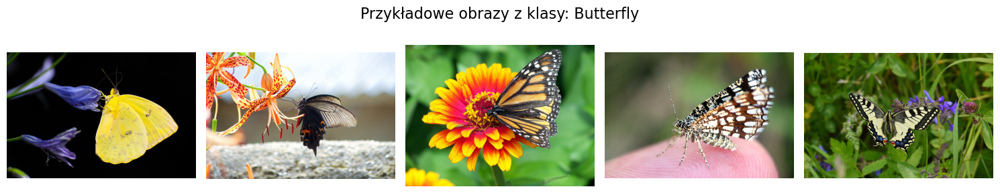

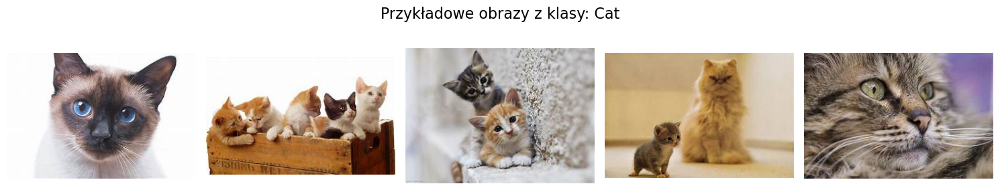

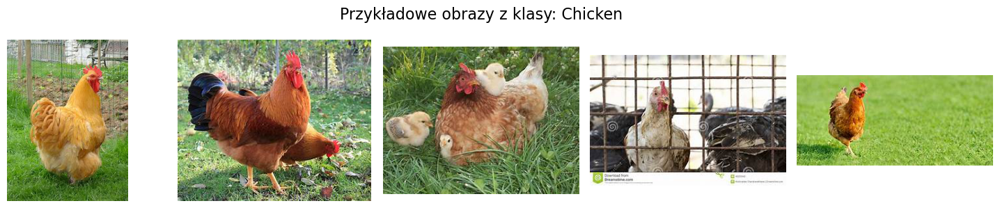

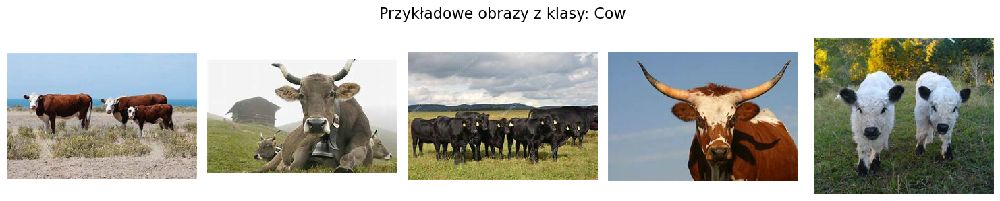

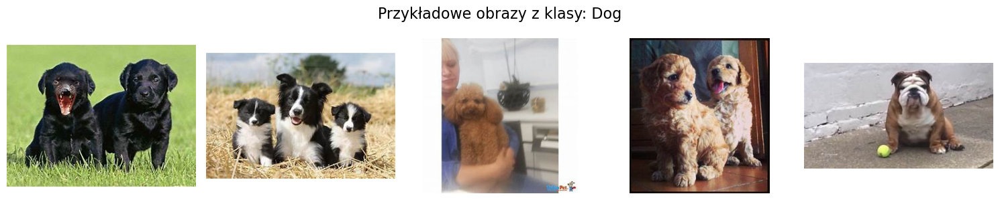

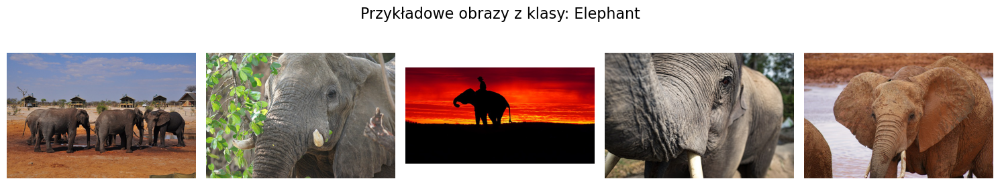

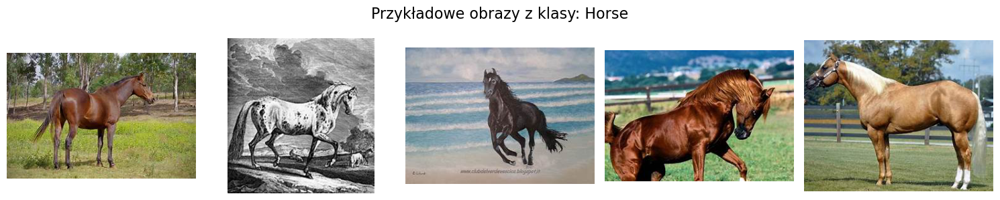

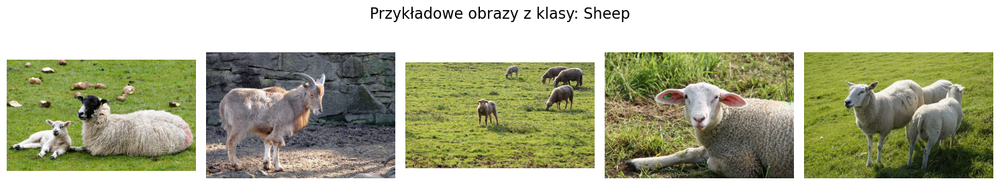

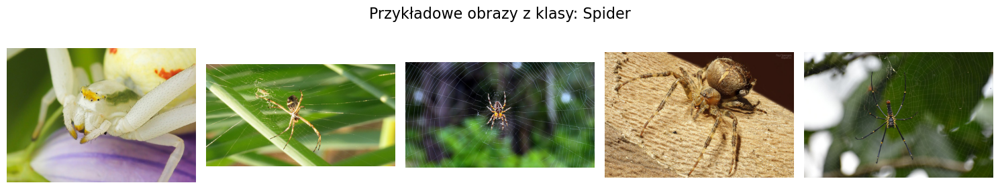

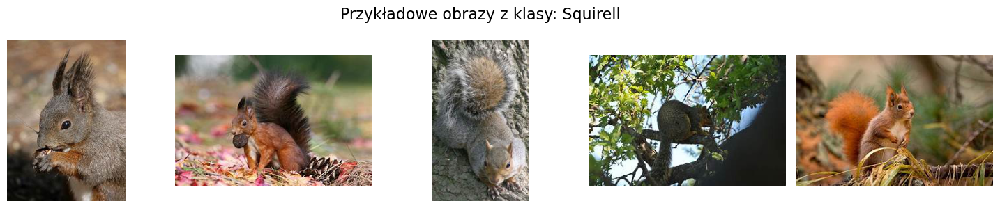

In [2]:
# wyświetlanie 5 obrazów z każdej klasy
def show_sample_images_from_each_class(base_dir, samples_per_class=5):
    class_dirs = [d for d in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, d))]

    for class_name in class_dirs:
        class_path = os.path.join(base_dir, class_name)
        image_files = [f for f in os.listdir(class_path) if f.lower().endswith(('.jpg', '.png', '.jpeg'))]
        selected_files = random.sample(image_files, min(samples_per_class, len(image_files)))
        
        plt.figure(figsize=(3 * samples_per_class, 3))
        plt.suptitle(f"Przykładowe obrazy z klasy: {class_name}", fontsize=16)

        for i, file_name in enumerate(selected_files):
            img_path = os.path.join(class_path, file_name)
            img = load_img(img_path)  # bez target_size – zachowuje proporcje
            plt.subplot(1, samples_per_class, i + 1)
            plt.imshow(img)
            plt.axis('off')
        
        plt.tight_layout()
        plt.show()

# Użycie
show_sample_images_from_each_class(".\\Data\\Train", samples_per_class=5)

In [3]:
# Model bez ostatniej warstwy klasyfikacyjnej
base_model = InceptionV3(weights='imagenet', include_top=False, pooling='avg')
model = Model(inputs=base_model.input, outputs=base_model.output)

---

Komentarz: **„Model bez ostatniej warstwy klasyfikacyjnej”** oznacza, że **nie używamy wbudowanej w model Inception v3 końcowej warstwy softmax**, która służy do przypisywania etykiet klas takich jak „kot”, „pies”, „żyrafa” – czyli klas ze zbioru **ImageNet**.

---

Model Inception v3 w wersji domyślnej (`include_top=True`) kończy się warstwą:

```plaintext
Dense(1000, activation='softmax')
```

…czyli ma 1000 neuronów odpowiadających 1000 klasom z ImageNet (np. „ostryga”, „maszyna do pisania”, „domowy kot syjamski”).

Ponieważ **nasze klasy (np. „kot”, „pies”, „koń”) mogą być zupełnie inne niż klasy z ImageNet**, ostatnia warstwa nie jest dla nas przydatna – **interesują nas cechy obrazu, a nie gotowa klasyfikacja Googla**.

---

Ustawiamy:

```python
include_top=False
pooling='avg'
```

Dzięki temu:

* pomijamy warstwy gęste i softmax
* **wyciągamy tylko embeddingi** – ostatnie wektory cech o długości **2048**
* możemy je traktować jako **numeryczną reprezentację obrazu**

---

In [4]:
# Funkcja, która przetwarza jeden obraz
def extract_features(image_path):
    img = load_img(image_path, target_size=(299, 299))  # InceptionV3: wymagany rozmiar 299x299
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)
    features = model.predict(img_array, verbose=0)
    return features.flatten()

In [5]:
# Funkcja, która przetwarza wszystkie obrazy w folderze
def process_folder(root_dir):
    data = []
    labels = []
    files = []
    
    for label in os.listdir(root_dir):
        class_dir = os.path.join(root_dir, label)
        if not os.path.isdir(class_dir):
            continue
        for fname in tqdm(os.listdir(class_dir), desc=f"Processing {label}"):
            if fname.lower().endswith(('.jpg', '.png', '.jpeg')):
                fpath = os.path.join(class_dir, fname)
                try:
                    vec = extract_features(fpath)
                    data.append(vec)
                    labels.append(label)
                    files.append(fname)
                except Exception as e:
                    print(f"Error processing {fpath}: {e}")
    
    df = pd.DataFrame(data)
    df['class'] = labels
    df['file'] = files
    return df

In [6]:
# Ekstrakcja i zapis do pliku – Train
start_train = time.time()
df_train = process_folder(".\\Data\\Train")
df_train.to_csv("inception_embeddings_train.csv", index=False)
end_train = time.time()
print(f"Czas wykonania ekstrakcji dla Train: {end_train - start_train:.2f} sekundy")

# Ekstrakcja i zapis do pliku – Test
start_test = time.time()
df_test = process_folder(".\\Data\\Test")
df_test.to_csv("inception_embeddings_test.csv", index=False)
end_test = time.time()
print(f"Czas wykonania ekstrakcji dla Test: {end_test - start_test:.2f} sekundy")

Processing Squirell: 100%|███████████████████████████████████████████████████████████| 301/301 [00:57<00:00,  5.25it/s]


Czas wykonania ekstrakcji dla Train: 450.57 sekundy


Processing Squirell: 100%|█████████████████████████████████████████████████████████████| 50/50 [00:09<00:00,  5.40it/s]


Czas wykonania ekstrakcji dla Test: 108.46 sekundy


# Tworzenie modelu

In [7]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

In [8]:
# Wczytanie danych
df_train = pd.read_csv("inception_embeddings_train.csv")
df_test = pd.read_csv("inception_embeddings_test.csv")

In [9]:
# Przygotowanie danych
X_train = df_train.drop(columns=["class", "file"])
y_train = df_train["class"]
X_test = df_test.drop(columns=["class", "file"])
y_test = df_test["class"]

In [10]:
# Random Forest
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

In [11]:
# Raport 
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

   Butterfly       1.00      0.90      0.95        50
         Cat       0.90      0.90      0.90        50
     Chicken       1.00      0.92      0.96        50
         Cow       0.84      0.94      0.89        50
         Dog       0.79      0.98      0.88        50
    Elephant       1.00      0.90      0.95        50
       Horse       0.94      0.94      0.94        50
       Sheep       0.96      0.88      0.92        50
      Spider       0.98      0.98      0.98        50
    Squirell       0.98      0.98      0.98        50

    accuracy                           0.93       500
   macro avg       0.94      0.93      0.93       500
weighted avg       0.94      0.93      0.93       500



<Figure size 1400x1200 with 0 Axes>

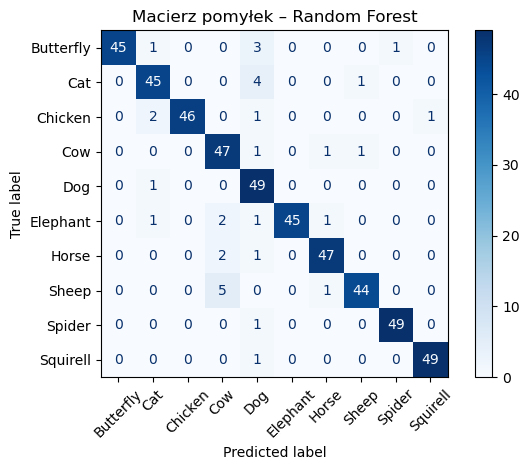

In [12]:
# Macierz pomyłek
plt.figure(figsize=(14, 12))
ConfusionMatrixDisplay.from_predictions(y_test, y_pred, xticks_rotation=45, cmap="Blues")
plt.title("Macierz pomyłek – Random Forest")
plt.tight_layout()
plt.show()

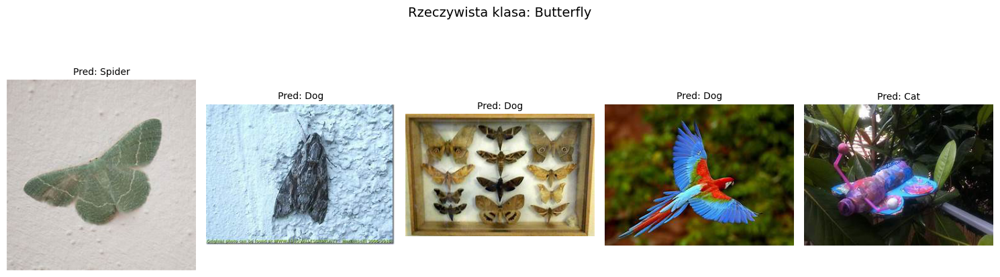

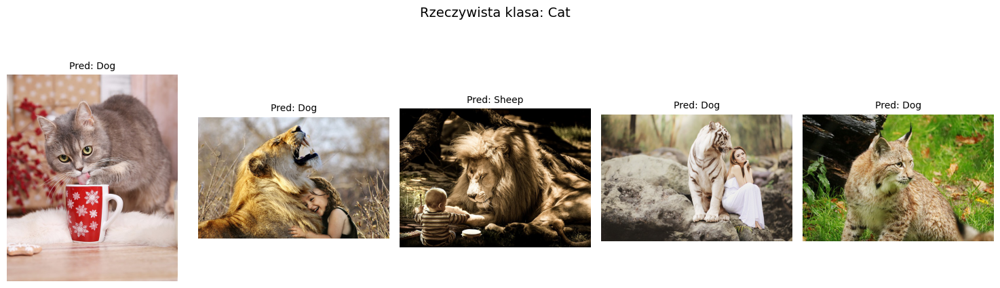

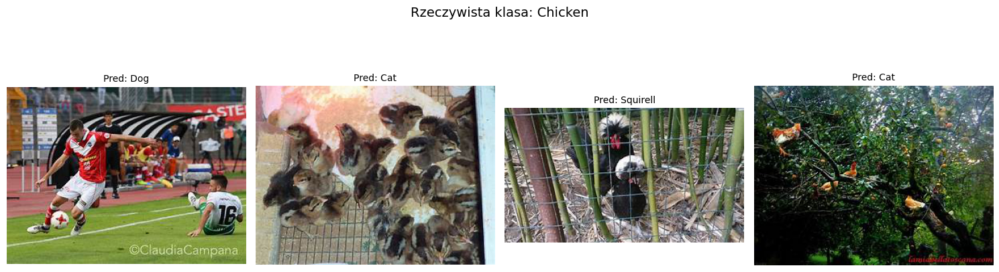

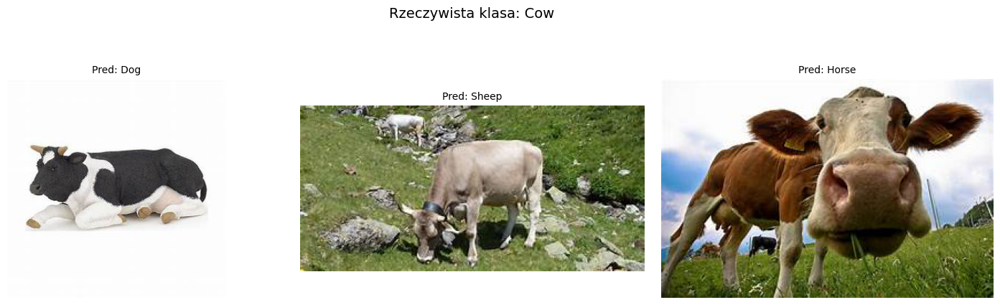

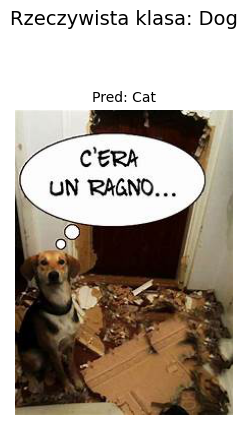

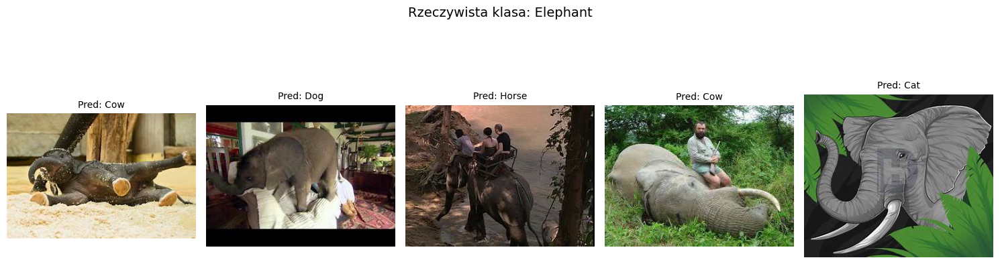

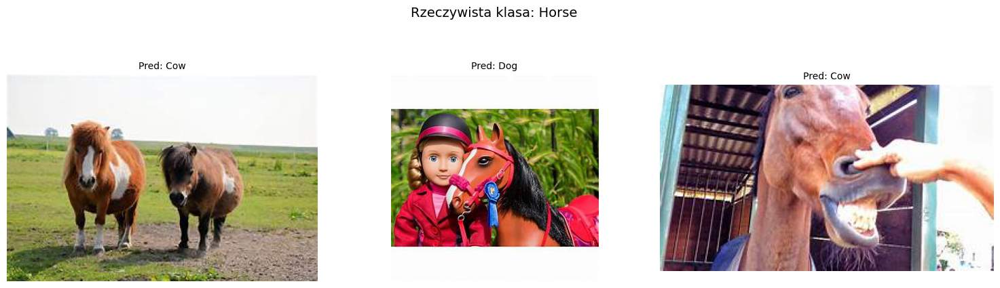

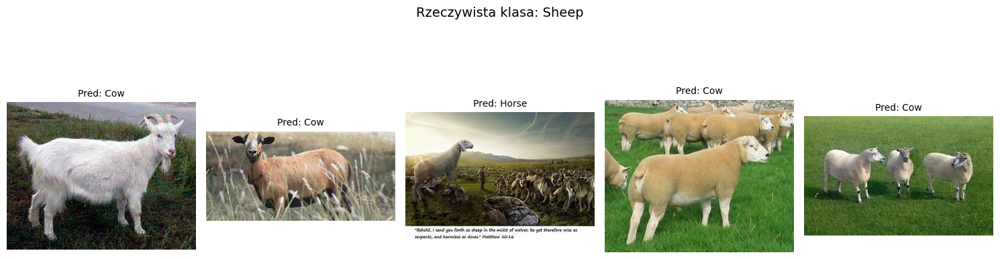

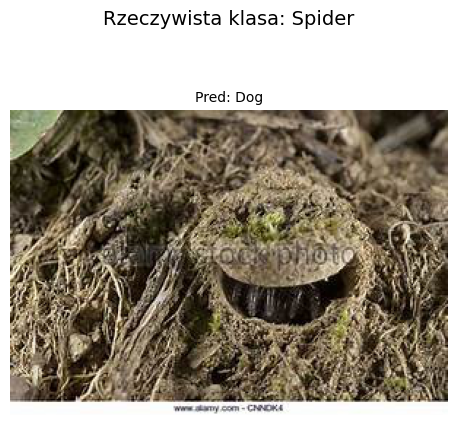

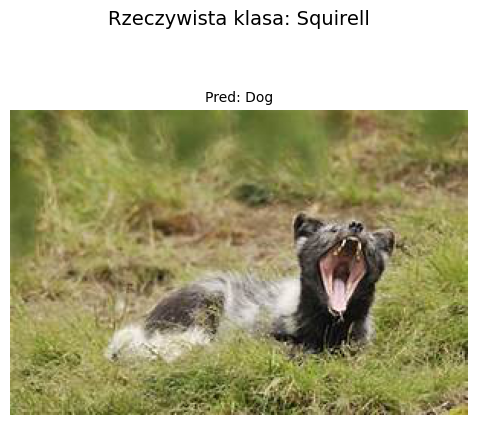

In [14]:
# Predykcje do ramki testowej
df_test["predicted"] = y_pred

# Błędnie sklasyfikowane
df_errors = df_test[df_test["class"] != df_test["predicted"]]

# Ścieżka do katalogu testowego
test_base_dir = "./Data/Test"

# Ile zdjęć pokazać na klasę
images_per_class = 5

# Grupy błędnych klasyfikacji wg klasy rzeczywistej
grouped = df_errors.groupby("class")

for true_class, group in grouped:
    sample = group.sample(n=min(images_per_class, len(group)), random_state=42)

    plt.figure(figsize=(15, 4))  # stały rozmiar
    plt.suptitle(f"Rzeczywista klasa: {true_class}", fontsize=14, y=1.05)

    for i, (_, row) in enumerate(sample.iterrows()):
        pred_label = row["predicted"]
        filename = row["file"]
        image_path = os.path.join(test_base_dir, true_class, filename)

        try:
            img = load_img(image_path)
            plt.subplot(1, len(sample), i + 1)
            plt.imshow(img)
            plt.axis('off')
            plt.title(f"Pred: {pred_label}", fontsize=10)
        except Exception as e:
            print(f"Nie można załadować obrazu: {image_path} ({e})")

    plt.tight_layout()
    plt.subplots_adjust(top=0.80)  # żeby tytuł się mieścił
    plt.show()

Klasyfikacja obrazów zwierząt została przeprowadzona z użyciem embeddingów z modelu Inception v3 oraz klasyfikatora Random Forest, z oceną wyników na podstawie macierzy pomyłek i analizy błędnych predykcji. Model Random Forest osiągnął wysoką skuteczność klasyfikacji na danych testowych, a większość błędów dotyczyła nietypowych zdjęć zwierząt.